<a href="https://colab.research.google.com/github/olonok69/LLM_Notebooks/blob/main/google/RAG_Multimodal_Gemini.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Google AI Python SDK for the Gemini API
https://github.com/google-gemini/generative-ai-python

https://github.com/google-gemini/cookbook

# ChromaDB
https://cookbook.chromadb.dev/

# Tesseract

Tesseract was originally developed at Hewlett-Packard Laboratories Bristol UK and at Hewlett-Packard Co, Greeley Colorado USA between 1985 and 1994, with some more changes made in 1996 to port to Windows, and some C++izing in 1998. In 2005 Tesseract was open sourced by HP. From 2006 until November 2018 it was developed by Google.


https://github.com/tesseract-ocr/tesseract


In [37]:
!apt install tesseract-ocr libtesseract-dev --quiet
!pip install -q -U google-generativeai chromadb pytesseract --quiet

Reading package lists...
Building dependency tree...
Reading state information...
libtesseract-dev is already the newest version (4.1.1-2.1build1).
tesseract-ocr is already the newest version (4.1.1-2.1build1).
0 upgraded, 0 newly installed, 0 to remove and 45 not upgraded.


In [2]:
import time
from tqdm import tqdm
import pathlib
import google.generativeai as genai
import chromadb
from chromadb import Documents, EmbeddingFunction, Embeddings
import pandas as pd
from PIL import Image
import pytesseract
from IPython.display import Markdown

In [3]:
from google.colab import userdata
GOOGLE_API_KEY=userdata.get('GOOGLE_API_KEY')

genai.configure(api_key=GOOGLE_API_KEY)

# Data

Apollo 11 missions, from NASA's public archive.

1. Text: You have the full final NASA report post-mission, spanning over 300
pages of incredibly informative content that details a summary of everything
that happened as well as conclusions that NASA researchers and engineers
came to. For the sake of this exercise, we've selected 3 particularly interesting pages, and converted them to images (you'll see soon why).

2. Video: You also have several clips of the famous Neil Armstrong and Buzz Aldrin footage as they
first stepped onto the moon, containing highlights of their moonwalks as well
as raising the American flag.

3. Audio: Finally, you have highlights from the audio recorded throughout the
mission, which provides insights into how communication between the astronauts
occurred as well as from the astronauts to mission control.


## Data Preparation

Before we begin, ensure that you've uploaded the resources.zip folder and unzipped it using the following command:

In [4]:
!wget -O resources.zip "https://video.udacity-data.com/topher/2024/June/66744e79_resources/resources.zip"

--2024-07-13 10:29:24--  https://video.udacity-data.com/topher/2024/June/66744e79_resources/resources.zip
Resolving video.udacity-data.com (video.udacity-data.com)... 104.19.142.72, 104.19.138.72, 104.19.139.72, ...
Connecting to video.udacity-data.com (video.udacity-data.com)|104.19.142.72|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 286142532 (273M) [application/zip]
Saving to: ‘resources.zip’

resources.zip       100%[===================>] 272.89M   232MB/s    in 1.2s    

2024-07-13 10:29:25 (232 MB/s) - ‘resources.zip’ saved [286142532/286142532]



In [5]:
!unzip resources.zip

Archive:  resources.zip
   creating: resources/
  inflating: __MACOSX/._resources    
   creating: resources/video/
  inflating: __MACOSX/resources/._video  
  inflating: resources/.DS_Store     
  inflating: __MACOSX/resources/._.DS_Store  
   creating: resources/audio/
  inflating: __MACOSX/resources/._audio  
   creating: resources/text/
  inflating: __MACOSX/resources/._text  
  inflating: resources/video/Apollo11PlaqueComparison.mov  
  inflating: __MACOSX/resources/video/._Apollo11PlaqueComparison.mov  
  inflating: resources/video/Apollo11Intro.mov  
  inflating: __MACOSX/resources/video/._Apollo11Intro.mov  
  inflating: resources/video/Apollo11MoonwalkMontage.mov  
  inflating: __MACOSX/resources/video/._Apollo11MoonwalkMontage.mov  
  inflating: resources/video/OneSmallStepCompilation.mov  
  inflating: __MACOSX/resources/video/._OneSmallStepCompilation.mov  
  inflating: resources/video/RaisingTheAmericanFlag.mov  
  inflating: __MACOSX/resources/video/._RaisingTheAmericanFl


As we saw throughout this course, when working with different types of data,
we first need to parse it in a way that Gemini can understand. We will prepare our data by extracting all file names from the `resources` directory.

In [6]:
data_dir = pathlib.Path("resources/")
all_file_names = [str(file) for file in data_dir.rglob("*") if file.is_file() and not file.name.startswith('.')]

In [7]:
for file_name in all_file_names:
    print(file_name)

print(len(all_file_names))

resources/text/images-333.jpg
resources/text/images-020.jpg
resources/text/images-023.jpg
resources/audio/Apollo11OnboardAudioHighlightClip2.mp3
resources/audio/Apollo11OnboardAudioHighlightClip3.mp3
resources/audio/Apollo11OnboardAudioHighlightClip4.mp3
resources/audio/Apollo11OnboardAudioHighlightClip1.mp3
resources/audio/Apollo11OnboardAudioHighlightClip5.mp3
resources/video/Apollo11PlaqueComparison.mov
resources/video/RaisingTheAmericanFlag.mov
resources/video/BuzzDescendsCompilation.mov
resources/video/Apollo11Intro.mov
resources/video/OneSmallStepCompilation.mov
resources/video/Apollo11MoonwalkMontage.mov
14


You should expect to see 14 files.

In [31]:
from IPython.display import Audio, display
display(Audio("resources/audio/Apollo11OnboardAudioHighlightClip2.mp3", autoplay=True))

In [34]:
import imageio
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from skimage.transform import resize
from IPython.display import HTML

def display_video(video):
    fig = plt.figure(figsize=(3,3))  #Display size specification

    mov = []
    for i in range(len(video)):  #Append videos one by one to mov
        img = plt.imshow(video[i], animated=True)
        plt.axis('off')
        mov.append([img])

    #Animation creation
    anime = animation.ArtistAnimation(fig, mov, interval=50, repeat_delay=1000)

    plt.close()
    return anime

In [36]:
video = imageio.mimread('resources/video/Apollo11PlaqueComparison.mov',  memtest=False)  #Loading video
#video = [resize(frame, (256, 256))[..., :3] for frame in video]    #Size adjustment (if necessary)
HTML(display_video(video).to_html5_video())

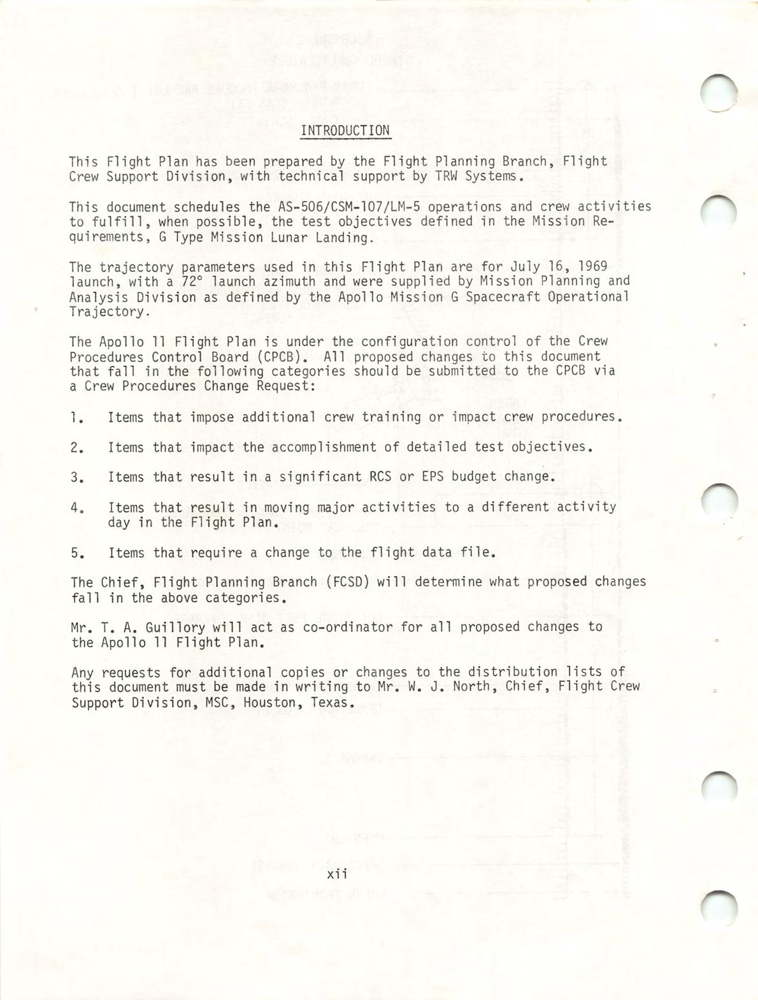

In [29]:
Image.open("resources/text/images-020.jpg")

## Retrieval Augmented Generation (RAG)

To showcase how we build a RAG, we will first build one for the Text case, and generalize it further after. Here is the general idea:
1. **Data Preparation** (done above): We first collected various types of data from NASA's public archive related to the Apollo 11 mission, including text, video, and audio files.
2. **Data Extraction and Summarization**: Extract the multimodal data from images, e.g. extract text from images using Optical Character Recognition (OCR), and use Gemini to generate summaries using a specialized prompt.
3. **Embedding Generation**: Convert the generated summaries into vector embeddings using Gemini's Text Embedding Model. These embeddings represent the summaries in a numerical format suitable for efficient similarity searches.
4. **Creating a Vector Database**: A Vector database was created to store the embeddings. This database facilitates fast and efficient retrieval of relevant documents based on similarity searches. We chose to use Chroma DB.
5. **Querying the RAG System**: For a given query, the system retrieves the most relevant documents (based on their embeddings) and generates a response using the retrieved documents as context.

Something important to note is that RAGs are usually used only when there is a surplus of data. In other words, if the data can't fit into the model prompt. In this case, the data we provided likely can fit into Gemini's 1 million token window, but for the sake of simplicity and restrictions of Google Colab's runtime, we opted to use a smaller set of data.

### Text

We will use Tesseract OCR (Optical Character Recognition) to extract text from images of the NASA report.

In [8]:
pytesseract.pytesseract.tesseract_cmd = (r'/usr/bin/tesseract')

Let's create a function to take in our images of a PDF, transcribe them into text, and summarize each of them.

In [9]:
def create_text_summary():
  path = pathlib.Path("resources/text")

  text_summary_prompt = f"""You are an assistant tailored for summarizing text for retrieval.
  These summaries will be turned into vector embeddings and used to retrieve the raw text.
  Give a concise summary of the text that is well optimized for retrieval. Here is the text."""

  images = []
  text_summaries = []

  for f in path.glob("*"):
    if f.is_dir() or f.name.startswith('.'):
      continue

    image = Image.open(f)
    response = model.generate_content([text_summary_prompt, pytesseract.image_to_string(image)])

    images.append(image)
    text_summaries.append(response.text)

  return images, text_summaries

In [10]:
safety_settings = [
    {
        "category": "HARM_CATEGORY_DANGEROUS_CONTENT",
        "threshold": "BLOCK_NONE",
    },
]

model = genai.GenerativeModel('models/gemini-1.5-flash', safety_settings=safety_settings)

In [11]:
image_files, text_summaries = create_text_summary()

Now, we can check out the generated summaries of the three pages we have!

In [12]:
for text_summary in text_summaries:
  print(text_summary)

This document outlines assumptions and ground rules for EPS analysis, focusing on battery usage, equipment operation, and system configurations during a lunar mission. It details the timing of battery activation, the duration of checkout, and the operational state of various subsystems like S-band equipment, rendezvous radar, and navigation systems. 

This document outlines the Apollo 11 mission plan, focusing on the AS-506/CSM-107/LM-5 operations and crew activities. It details the trajectory parameters used for a July 16, 1969 launch and highlights the configuration control by the Crew Procedures Control Board (CPCB) for proposed changes. The document specifies criteria for submitting proposed changes to the CPCB and designates Mr. T. A. Guillory as the coordinator for all proposed changes.  Requests for copies or distribution list modifications should be directed to Mr. W. J. North. 

This document outlines the mission profile for the Apollo 11 lunar landing mission, including launc

We create the Chroma database using the generated summaries. You might be wondering what Vector DB and Chroma DB are.

**Vector Database**: A specialized database designed to store and manage high-dimensional vectors, which are numerical representations of data points. It allows efficient similarity searches to find vectors (and their corresponding data) that are close to a given query vector.

**Chroma DB**: An implementation of a vector database used to store and retrieve vector embeddings. These embeddings are generated from our summaries and allow us to perform efficient similarity searches.


In [13]:
class GeminiEmbeddingFunction(EmbeddingFunction):
  def __call__(self, input: Documents) -> Embeddings:
    model = 'models/text-embedding-004'
    title = "Custom query"
    return genai.embed_content(model=model,
                                content=input,
                                task_type="retrieval_document",
                                title=title)["embedding"]

In [14]:
def create_chroma_db(documents, name):
  chroma_client = chromadb.Client()
  db = chroma_client.get_or_create_collection(name=name, embedding_function=GeminiEmbeddingFunction())

  for i, d in enumerate(documents):
    db.add(
      documents=d,
      ids=str(i)
    )
  return db

In [15]:
text_db = create_chroma_db(text_summaries, "text_nasa")

Let's also take a peak at the `text_db` and ensure that embeddings were generated:

In [16]:
data = {
    'embeddings': text_db.peek()['embeddings'],
    'documents': text_db.peek()['documents']
}

df = pd.DataFrame.from_dict(data, orient='index').transpose()
df

,embeddings,documents
0,"[0.07681135088205338, 0.004147910978645086, -0...",This document outlines assumptions and ground ...
1,"[0.06318074464797974, 0.019219275563955307, 0....",This document outlines the Apollo 11 mission p...
2,"[0.0861559808254242, -0.0051480247639119625, 0...",This document outlines the mission profile for...


You should see a column called `embeddings` with what are seemingly random values, but these values are actually high-dimensional vectors that represent the semantic meaning of your summaries.

Now let's actually try querying our information. We'll test a simple example like getting some file that has to do with the Apollo 11 Flight Plan.

In [17]:
def get_relevant_files(query, db):
  results = db.query(query_texts=[query], n_results=3)
  return results["ids"][0]

In [18]:
files = get_relevant_files("Apollo 11 Flight Plan", text_db)
print(files)

['1', '2', '0']


You should expect to see something like `['1', '0', '2']`. This means that the first entry in the `text_db` is most similar. If you look above at our `pd.DataFrame` output, the document with id 1 is the document about the Apollo 11 Flight Plan, so this is working as we expected!

### Video and Audio

Now, let's extend this concept to Video and Audio, and build out some more complex queries. We'll begin by generalizing the above summary creation function to all sorts of modalities.

In [19]:
def create_summary(modality):
  path = data_dir / modality

  summary_prompt = f"""You are an assistant tailored for summarizing {modality} for retrieval.
  These summaries will be turned into vector embeddings and used to retrieve the raw {modality}.
  Give a concise summary of the {modality} that is well optimized for retrieval. Here is the {modality}."""

  files = []
  summaries = []

  for f in path.glob("*"):
    if f.is_dir() or f.name.startswith('.'):
      continue
    print(f)

    if modality == "text":
      file = Image.open(f)
      response = model.generate_content([summary_prompt, pytesseract.image_to_string(file)])

    else:
      file = genai.upload_file(f)

      while file.state.name == "PROCESSING":
        print("Waiting for video file upload...\n", end='')
        time.sleep(5)
        file = genai.get_file(file.name)

      response = model.generate_content([summary_prompt, file])

    files.append(file)
    summaries.append(response.text)

  return files, summaries

Now, we will create a folder with all of our data of different modalities. In particular, the first 5 are audio files, next 3 are text files, and final 6 are video files.

In [20]:
all_files = []
all_summaries = []

for modality_type in ["audio", "text", "video"]:
  files, summaries = create_summary(modality_type)
  all_files.extend(files)
  all_summaries.extend(summaries)

resources/audio/Apollo11OnboardAudioHighlightClip2.mp3
resources/audio/Apollo11OnboardAudioHighlightClip3.mp3
resources/audio/Apollo11OnboardAudioHighlightClip4.mp3
resources/audio/Apollo11OnboardAudioHighlightClip1.mp3
resources/audio/Apollo11OnboardAudioHighlightClip5.mp3
resources/text/images-333.jpg
resources/text/images-020.jpg
resources/text/images-023.jpg
resources/video/Apollo11PlaqueComparison.mov
Waiting for video file upload...
resources/video/RaisingTheAmericanFlag.mov
Waiting for video file upload...
resources/video/BuzzDescendsCompilation.mov
Waiting for video file upload...
resources/video/Apollo11Intro.mov
Waiting for video file upload...
resources/video/OneSmallStepCompilation.mov
Waiting for video file upload...
resources/video/Apollo11MoonwalkMontage.mov
Waiting for video file upload...


In [21]:
db = create_chroma_db(all_summaries, "nasa")

Again, ensure that the embeddings were generated. Notice that now, we have audio, video, and text data.

In [22]:
data = {
    'embeddings': db.peek()['embeddings'],
    'documents': db.peek()['documents']
}

df = pd.DataFrame.from_dict(data, orient='index').transpose()
df

,embeddings,documents
0,"[0.06439229100942612, -0.033821217715740204, -...",A crew is discussing the status of a spacecraf...
1,"[0.05298065021634102, -0.015863211825489998, -...",A group of astronauts are discussing the moon'...
2,"[0.0371699333190918, -0.05854009464383125, -0....",A comparison of a NASA archive video and a 200...
3,"[0.0590030699968338, 0.001475973636843264, -0....",The Apollo 11 mission launched from Earth and ...
4,"[0.025219378992915154, -0.015756970271468163, ...",A grainy black and white video of Neil Armstro...
5,"[0.04575385898351669, 0.009696882218122482, -0...",The first men to walk on the moon plant an Ame...
6,"[0.024542050436139107, -0.010024108923971653, ...",A conversation between two pilots about the ap...
7,"[0.013058341108262539, -0.0019037678139284253,...",Two people are talking about flying a drone. T...
8,"[0.036299046128988266, 0.011709511280059814, -...",A discussion about aircraft operations. Includ...
9,"[0.06430674344301224, 0.01719510182738304, -0....",This document outlines ground rules and assump...


In [23]:
files = get_relevant_files("communication with Mission Control", db)
print(files)

['0', '2', '6']


Can we do more than just return the most relevant file? Yes we can! We can ask Gemini to return a response to the query using the files it thinks are most relevant, provide an answer and tell us what files it used! This is really exciting, and has vast applications in many industries.

In [24]:
def query_rag(query, db):
    files = get_relevant_files(query, db)
    prompt = [all_files[int(f)] for f in files]
    prompt.append("Generate a response to the query using the provided files. Here is the query.")
    prompt.append(query)
    return model.generate_content(prompt).text, [all_file_names[int(f)] for f in files]

In [25]:
for response in query_rag("Explain what happened with the Apollo 11 Mission.", db):
    print(response)

The Apollo 11 Mission was a successful mission which landed the first humans on the moon.  On July 20th, 1969, Neil Armstrong became the first man to walk on the moon. 

['resources/video/Apollo11Intro.mov', 'resources/audio/Apollo11OnboardAudioHighlightClip5.mp3', 'resources/video/Apollo11PlaqueComparison.mov']


In [30]:
query_rag("What are the trajectory parameters of the Apollo 11 mission?", db)

('The trajectory parameters of the Apollo 11 mission are defined in the Apollo Mission G for July 16, 1969 launch, with a 72-second launch azimuth and were supplied by Mission Planning and Analysis Division as used by the Flight Plan are for July 16, 1969 Trajectory. ',
 ['resources/audio/Apollo11OnboardAudioHighlightClip1.mp3',
  'resources/audio/Apollo11OnboardAudioHighlightClip5.mp3',
  'resources/video/Apollo11Intro.mov'])